<a href="https://colab.research.google.com/github/Theodr8/AICODEAOL/blob/main/ai_music.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Kelompok 5

* Derrick Gunawan - 2702247701
* Kevin Tan - 27022322765
* Theodore Alexander - 2702217453


In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
andradaolteanu_gtzan_dataset_music_genre_classification_path = kagglehub.dataset_download('andradaolteanu/gtzan-dataset-music-genre-classification')

print('Data source import complete.')

Data source import complete.


In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/gtzan-dataset-music-genre-classification/Data/features_3_sec.csv
/kaggle/input/gtzan-dataset-music-genre-classification/Data/features_30_sec.csv
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00005.png
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00057.png
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00020.png
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00072.png
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00040.png
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00043.png
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00010.png
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00071.png
/kaggle/input/gtzan-dataset-music-genre-classification/Data/image

In [ ]:
path = '/kaggle/input/gtzan-dataset-music-genre-classification/Data/'

genre = os.listdir('/kaggle/input/gtzan-dataset-music-genre-classification/Data/genres_original')

print(genre)

['disco', 'metal', 'reggae', 'blues', 'rock', 'classical', 'jazz', 'hiphop', 'country', 'pop']


In [ ]:
df = pd.read_csv(f"{path}features_30_sec.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 60 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   filename                 1000 non-null   object 
 1   length                   1000 non-null   int64  
 2   chroma_stft_mean         1000 non-null   float64
 3   chroma_stft_var          1000 non-null   float64
 4   rms_mean                 1000 non-null   float64
 5   rms_var                  1000 non-null   float64
 6   spectral_centroid_mean   1000 non-null   float64
 7   spectral_centroid_var    1000 non-null   float64
 8   spectral_bandwidth_mean  1000 non-null   float64
 9   spectral_bandwidth_var   1000 non-null   float64
 10  rolloff_mean             1000 non-null   float64
 11  rolloff_var              1000 non-null   float64
 12  zero_crossing_rate_mean  1000 non-null   float64
 13  zero_crossing_rate_var   1000 non-null   float64
 14  harmony_mean             

In [ ]:
df.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


# visualisasi data

In [ ]:
import librosa
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

In [ ]:
tes_data = '/kaggle/input/gtzan-dataset-music-genre-classification/Data/genres_original/hiphop/hiphop.00033.wav'
tes_data2 = '/kaggle/input/gtzan-dataset-music-genre-classification/Data/genres_original/blues/blues.00003.wav'

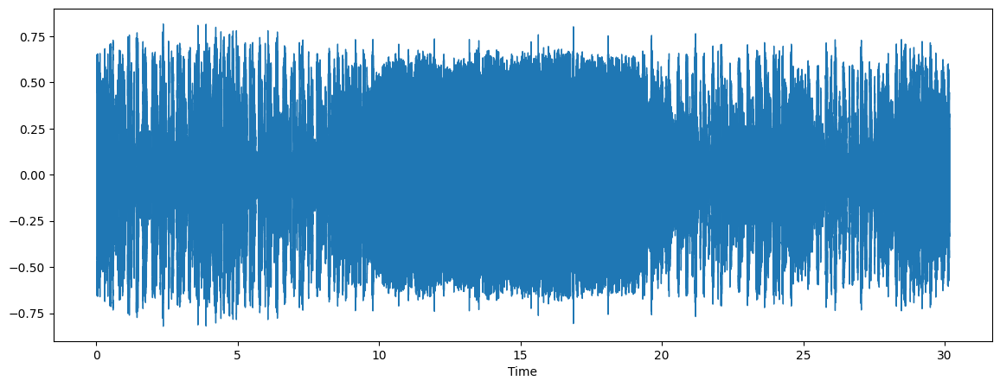

In [ ]:
y,sr = librosa.load(tes_data,sr = 44100)
plt.figure(figsize=(14,5))
librosa.display.waveshow(y,sr=sr)

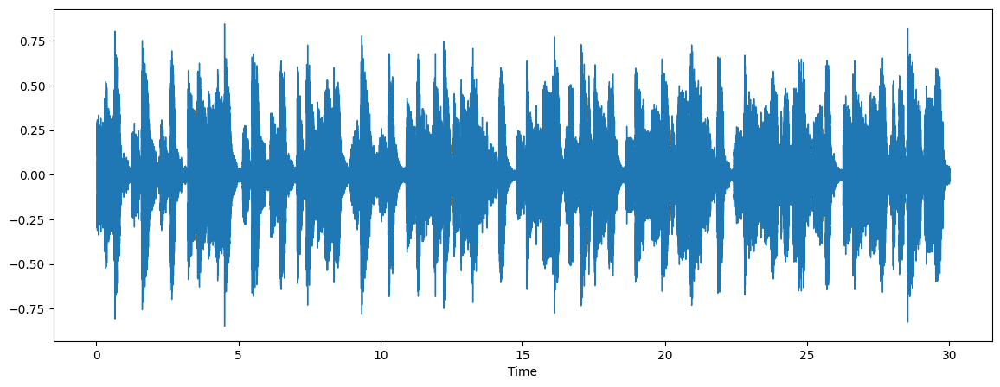

In [ ]:
y2,sr2 = librosa.load(tes_data2,sr = 44100)
plt.figure(figsize=(14,5))
librosa.display.waveshow(y2,sr=sr2)

In [ ]:
from IPython.display import Audio
Audio(data=y,rate=sr)
Audio(data=y2,rate=sr2)

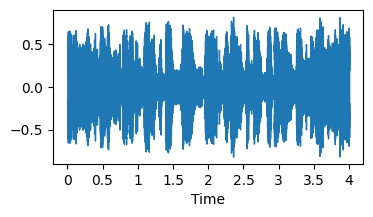

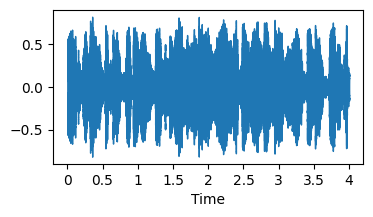

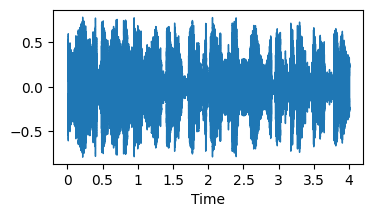

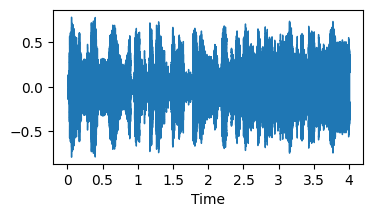

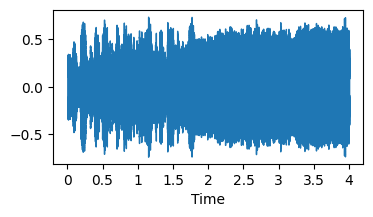

...

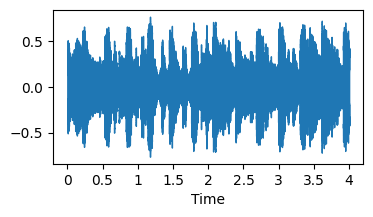

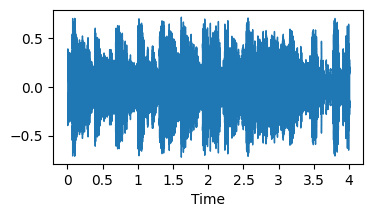

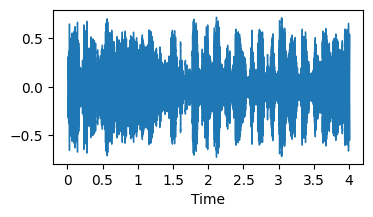

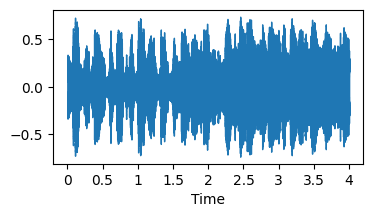

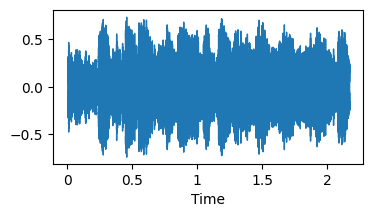

In [ ]:
audio_path = "/kaggle/input/gtzan-dataset-music-genre-classification/Data/genres_original/hiphop/hiphop.00033.wav"
y, sr = librosa.load(audio_path, sr=None)  # sr=None to keep the original sampling rate

# Define the duration of each chunk and overlap
chunk_duration = 4  # seconds
overlap_duration = 2  # seconds

# Convert durations to samples
chunk_samples = chunk_duration * sr
overlap_samples = overlap_duration * sr

# Calculate the number of chunks
num_chunks = int(np.ceil((len(y) - chunk_samples) / (chunk_samples - overlap_samples))) + 1

# Iterate over each chunk
for i in range(num_chunks):
    # Calculate start and end indices of the chunk
    start = i * (chunk_samples - overlap_samples)
    end = start + chunk_samples

    # Extract the chunk of audio
    chunk = y[start:end]
    plt.figure(figsize=(4, 2))
    librosa.display.waveshow(chunk, sr=sr)
    plt.show()

# preprocessing

In [ ]:
folder = '/kaggle/input/gtzan-dataset-music-genre-classification/Data/genres_original'
genrse = ['blues', 'classical','country','disco','hiphop','jazz','metal','pop','reggae','rock']

In [ ]:
from skimage.transform import resize

In [ ]:
def load_and_preprocess_data(data_dir, classes, target_shape=(150, 150)):
    data = []
    labels = []

    for i_class, class_name in enumerate(classes):
        class_dir = os.path.join(data_dir, class_name)
        print("Processing--", class_name)
        for filename in os.listdir(class_dir):
            if filename.endswith('.wav'):
                file_path = os.path.join(class_dir, filename)
                try:
                    audio_data, sample_rate = librosa.load(file_path, sr=None)
                    # Preprocessing
                    chunk_duration = 4
                    overlap_duration = 2

                    chunk_samples = chunk_duration * sample_rate
                    overlap_samples = overlap_duration * sample_rate

                    num_chunks = int(np.ceil((len(audio_data) - chunk_samples) / (chunk_samples - overlap_samples))) + 1

                    for i in range(num_chunks):
                        start = i * (chunk_samples - overlap_samples)
                        end = start + chunk_samples
                        chunk = audio_data[start:end]

                        mel_spectrogram = librosa.feature.melspectrogram(y=chunk, sr=sample_rate)
                        mel_spectrogram = resize(np.expand_dims(mel_spectrogram, axis=-1), target_shape)

                        data.append(mel_spectrogram)
                        labels.append(i_class)
                except Exception as e:
                    print(f"Warning: Skipping file {file_path} due to error: {e}")
                    continue

    return np.array(data), np.array(labels)

In [ ]:
data,labels = load_and_preprocess_data(folder,genre)

Processing-- disco
Processing-- metal
Processing-- reggae
Processing-- blues
Processing-- rock
Processing-- classical
Processing-- jazz


<ipython-input-23-96d8ef0811a9>:12: UserWarning: PySoundFile failed. Trying audioread instead.
  audio_data, sample_rate = librosa.load(file_path, sr=None)
/usr/local/lib/python3.11/dist-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


Processing-- hiphop
Processing-- country
Processing-- pop


In [ ]:
data.shape

(14975, 150, 150, 1)

In [ ]:
labels.shape

(14975,)

In [ ]:
from tensorflow.keras.utils import to_categorical

In [ ]:
labels = to_categorical(labels,num_classes = len(genre))

In [ ]:

from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test = train_test_split(data,labels,test_size=0.2,random_state=42)

# Model

In [ ]:
from tensorflow.keras.layers import Conv2D,MaxPool2D,Flatten,Dense,Dropout
from tensorflow.keras.optimizers import Adam

In [ ]:
model = tf.keras.models.Sequential()

In [ ]:
X_train[0].shape

(150, 150, 1)

In [ ]:
model.add(Conv2D(filters=32,kernel_size=3,padding='same',activation='relu',input_shape=X_train[0].shape))
model.add(Conv2D(filters=32,kernel_size=3,activation='relu'))
model.add(MaxPool2D(pool_size=2,strides=2))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model.add(Conv2D(filters=64,kernel_size=3,padding='same',activation='relu'))
model.add(Conv2D(filters=64,kernel_size=3,activation='relu'))
model.add(MaxPool2D(pool_size=2,strides=2))

In [ ]:
model.add(Conv2D(filters=128,kernel_size=3,padding='same',activation='relu'))
model.add(Conv2D(filters=128,kernel_size=3,activation='relu'))
model.add(MaxPool2D(pool_size=2,strides=2))

In [ ]:
model.add(Dropout(0.3))

In [ ]:
model.add(Conv2D(filters=256,kernel_size=3,padding='same',activation='relu'))
model.add(Conv2D(filters=256,kernel_size=3,activation='relu'))
model.add(MaxPool2D(pool_size=2,strides=2))

In [ ]:
model.add(Conv2D(filters=512,kernel_size=3,padding='same',activation='relu'))
model.add(Conv2D(filters=512,kernel_size=3,activation='relu'))
model.add(MaxPool2D(pool_size=2,strides=2))


In [ ]:
model.add(Dropout(0.3))


In [ ]:
model.add(Flatten())


In [ ]:
model.add(Dense(units=1200,activation='relu'))


In [ ]:
model.add(Dropout(0.45))

In [ ]:
model.add(Dense(units=len(genre),activation='softmax'))

In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 150, 150, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 148, 148, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 74, 74, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 72, 72, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 36, 36, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 34, 34, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 17, 17, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 15, 15, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 7, 7, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 7, 7, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 5, 5, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1200)           │     2,458,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │        12,010 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,182,458 (27.40 MB)

 Trainable params: 7,182,458 (27.40 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.compile(optimizer=Adam(learning_rate=0.0001),loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
training_history = model.fit(X_train,Y_train,epochs=30,batch_size=32,validation_data=(X_test,Y_test))

Epoch 1/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 56s 108ms/step - accuracy: 0.1975 - loss: 2.1494 - val_accuracy: 0.4047 - val_loss: 1.6519
Epoch 2/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 60s 80ms/step - accuracy: 0.4502 - loss: 1.5357 - val_accuracy: 0.5770 - val_loss: 1.2307
Epoch 3/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - accuracy: 0.5915 - loss: 1.1811 - val_accuracy: 0.6644 - val_loss: 1.0049
Epoch 4/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - accuracy: 0.6688 - loss: 0.9564 - val_accuracy: 0.7078 - val_loss: 0.8482
Epoch 5/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - accuracy: 0.7178 - loss: 0.8357 - val_accuracy: 0.7369 - val_loss: 0.7676
Epoch 6/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - accuracy: 0.7505 - loss: 0.7301 - val_accuracy: 0.7596 - val_loss: 0.7071
Epoch 7/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - accuracy: 0.8000 - loss: 0.5983 - val_accuracy: 0.7556 - val_loss: 0.7061
Epoch 8/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 41s 80ms/step - accuracy: 0.8269 - loss: 0.5150 -

In [ ]:
X_train.shape

(11980, 150, 150, 1)

In [ ]:
model.save("Trained_model.h5")

In [ ]:
training_history.history

{'accuracy': [0.2599332332611084,
  0.4965776205062866,
  0.6105175018310547,
  0.6770450472831726,
  0.7262938022613525,
  0.7651085257530212,
  0.8044240474700928,
  0.8313021659851074,
  0.8496661186218262,
  0.8737896680831909,
  0.8941569328308105,
  0.9118530750274658,
  0.9249582886695862,
  0.9265442490577698,
  0.94240403175354,
  0.9500834941864014,
  0.9503338932991028,
  0.9590985178947449,
  0.9630216956138611,
  0.9626043438911438,
  0.9683639407157898,
  0.975459098815918,
  0.9742069840431213,
  0.9772955179214478,
  0.9717863202095032,
  0.9838063716888428,
  0.9797996878623962,
  0.9765442609786987,
  0.9803839921951294,
  0.9861435890197754],
 'loss': [1.9873656034469604,
  1.4247844219207764,
  1.1266241073608398,
  0.9428240060806274,
  0.8137624263763428,
  0.7002520561218262,
  0.5832815170288086,
  0.5029121041297913,
  0.4413311779499054,
  0.37052032351493835,
  0.3136066496372223,
  0.26428985595703125,
  0.22103916108608246,
  0.21315869688987732,
  0.173541

In [ ]:
import json
with open('training_hist.json','w') as f:
  json.dump(training_history.history,f)

In [ ]:
model = tf.keras.models.load_model("Trained_model.h5")
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 150, 150, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 148, 148, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 74, 74, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 72, 72, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 36, 36, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 34, 34, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 17, 17, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 15, 15, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 7, 7, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 7, 7, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 5, 5, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1200)           │     2,458,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │        12,010 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,182,460 (27.40 MB)

 Trainable params: 7,182,458 (27.40 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [ ]:
import json
with open("training_hist.json",'r') as json_file:
    training_history_data = json.load(json_file)

In [ ]:
train_loss,train_accuracy = model.evaluate(X_train,Y_train)

375/375 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - accuracy: 0.9931 - loss: 0.0248


In [ ]:
train_loss,train_accuracy

(0.02425815723836422, 0.9931552410125732)

In [ ]:
val_loss,val_accuracy = model.evaluate(X_test,Y_test)

94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.8983 - loss: 0.3455


In [ ]:
val_loss, val_accuracy

(0.3517475724220276, 0.900166928768158)

In [ ]:
training_history_data['val_loss']

[1.6519094705581665,
 1.2306764125823975,
 1.004930853843689,
 0.8482462763786316,
 0.7676393985748291,
 0.7071484923362732,
 0.7060847878456116,
 0.5308871865272522,
 0.6356827020645142,
 0.5430570840835571,
 0.4354378879070282,
 0.42671820521354675,
 0.41203799843788147,
 0.48909929394721985,
 0.45992183685302734,
 0.39912405610084534,
 0.34025925397872925,
 0.37506917119026184,
 0.37035953998565674,
 0.39353543519973755,
 0.30508825182914734,
 0.429273396730423,
 0.3448881208896637,
 0.35965946316719055,
 0.3093699514865875,
 0.34326329827308655,
 0.5885564684867859,
 0.3874514698982239,
 0.3683977723121643,
 0.3517475724220276]

#evaluation

In [ ]:
y_pred = model.predict(X_test)
y_pred

94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step


array([[6.37907158e-11, 9.91676075e-08, 9.27138387e-07, ...,
        9.99998927e-01, 2.15325181e-13, 1.35356212e-10],
       [1.29983555e-05, 1.14650429e-04, 1.18834991e-03, ...,
        1.11558256e-04, 3.02988347e-02, 2.26227871e-06],
       [5.59973969e-08, 2.58299697e-05, 5.86691312e-05, ...,
        6.39861128e-06, 2.81362724e-03, 5.59084816e-04],
       ...,
       [9.99999881e-01, 1.08899756e-09, 1.24610267e-10, ...,
        7.41492423e-10, 1.68009029e-09, 1.00864135e-07],
       [3.75587073e-09, 9.99537110e-01, 1.04129434e-08, ...,
        4.02031030e-04, 1.75778436e-09, 5.19140686e-09],
       [2.74871559e-06, 8.60588898e-07, 1.19819603e-08, ...,
        7.75243123e-08, 2.80712652e-06, 1.66810660e-05]], dtype=float32)

In [ ]:
predicted_categories = np.argmax(y_pred,axis=1)
predicted_categories

array([7, 6, 6, ..., 0, 1, 4])

In [ ]:
true_categories = np.argmax(Y_test,axis=1)
true_categories

array([7, 6, 6, ..., 0, 1, 4])

In [ ]:
from sklearn.metrics import confusion_matrix,classification_report
cm = confusion_matrix(true_categories,predicted_categories)
# Precision Recall F1score
print(classification_report(true_categories,predicted_categories,target_names=genre))

              precision    recall  f1-score   support

       disco       0.93      0.94      0.94       302
       metal       0.90      0.97      0.94       299
      reggae       0.87      0.87      0.87       316
       blues       0.94      0.87      0.90       313
        rock       0.87      0.72      0.79       276
   classical       0.94      0.98      0.96       316
        jazz       0.94      0.93      0.93       298
      hiphop       0.95      0.91      0.93       289
     country       0.75      0.92      0.83       295
         pop       0.93      0.88      0.90       291

    accuracy                           0.90      2995
   macro avg       0.90      0.90      0.90      2995
weighted avg       0.90      0.90      0.90      2995



In [ ]:
cm

array([[284,   0,   2,   1,   5,   3,   0,   1,   2,   4],
       [  0, 290,   1,   0,   5,   0,   0,   3,   0,   0],
       [  7,   0, 275,   7,   3,   1,   1,   3,  16,   3],
       [  1,   1,  12, 271,   6,   2,   4,   0,  16,   0],
       [  9,  14,  10,   2, 199,   1,   2,   2,  33,   4],
       [  0,   0,   0,   0,   1, 310,   3,   0,   2,   0],
       [  0,   2,   1,   1,   2,   6, 277,   0,   9,   0],
       [  2,  10,   5,   0,   1,   0,   0, 264,   1,   6],
       [  0,   3,   4,   3,   3,   2,   7,   0, 271,   2],
       [  1,   1,   7,   2,   4,   4,   1,   5,  11, 255]])

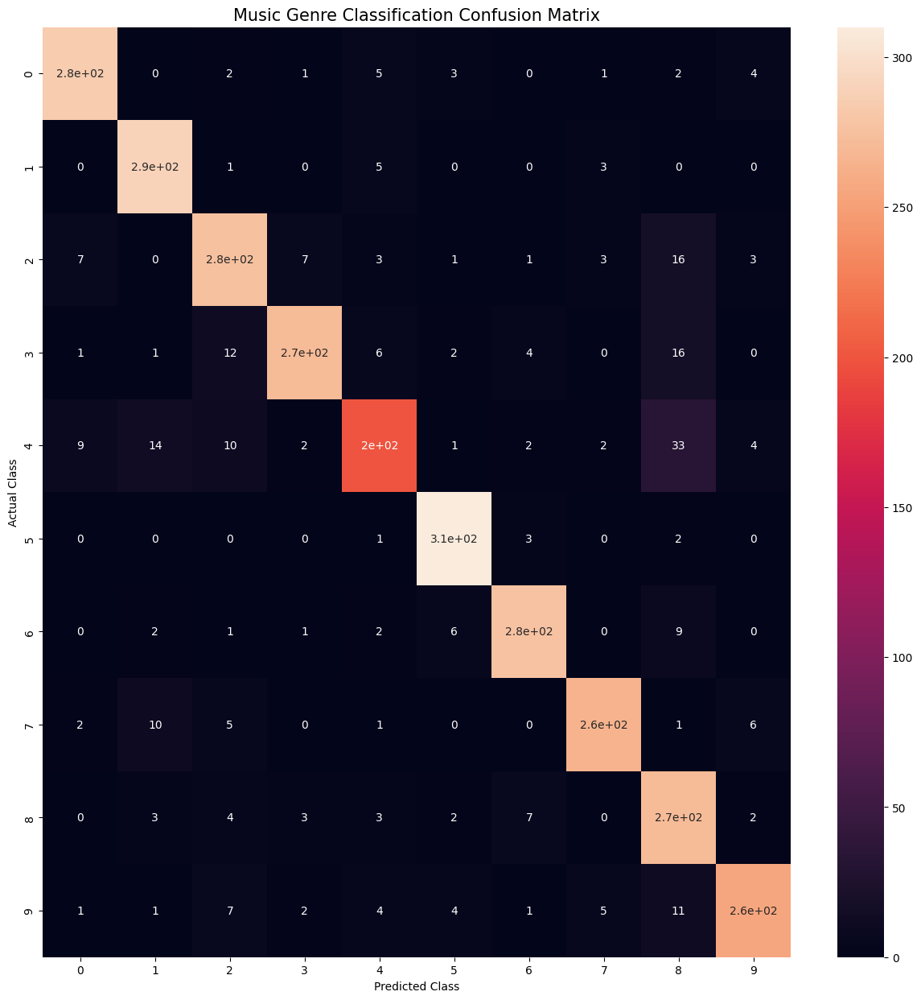

In [ ]:
import seaborn as sns
plt.figure(figsize=(15,15))
sns.heatmap(cm,annot=True,annot_kws={"size":10})
plt.xlabel("Predicted Class",fontsize=10)
plt.ylabel("Actual Class",fontsize=10)
plt.title("Music Genre Classification Confusion Matrix",fontsize=15)
plt.show()

#Test the model

In [ ]:
def load_and_preprocess_data(file_path, target_shape=(150, 150)):
    data = []
    audio_data, sample_rate = librosa.load(file_path, sr=None)

    chunk_duration = 4
    overlap_duration = 2


    chunk_samples = chunk_duration * sample_rate
    overlap_samples = overlap_duration * sample_rate

    num_chunks = int(np.ceil((len(audio_data) - chunk_samples) / (chunk_samples - overlap_samples))) + 1

    for i in range(num_chunks):
        start = i * (chunk_samples - overlap_samples)
        end = start + chunk_samples

        chunk = audio_data[start:end]

        mel_spectrogram = librosa.feature.melspectrogram(y=chunk, sr=sample_rate)

        mel_spectrogram = resize(np.expand_dims(mel_spectrogram, axis=-1), target_shape)
        data.append(mel_spectrogram)

    return np.array(data)

In [ ]:
musik = '/content/maadcity.m4a'
tes_x = load_and_preprocess_data(musik)

<ipython-input-64-bf26b26241c6>:3: UserWarning: PySoundFile failed. Trying audioread instead.
  audio_data, sample_rate = librosa.load(file_path, sr=None)


In [ ]:
Audio(data=musik,rate=sr)

In [ ]:
def prediksi(tes_x):
    y_pred = model.predict(tes_x)
    genre_musik = np.argmax(y_pred, axis=1)

    total = len(genre_musik)

    # Tangani kasus data kosong
    if total == 0:
        return None, {
            "error": "Data kosong. Tidak ada prediksi."
        }

    # Inisialisasi jumlah genre
    count = [0] * len(genre)
    for i in genre_musik:
        count[i] += 1

    # Hitung persentase
    persentase = [(c / total) * 100 for c in count]

    # Genre yang paling sering muncul
    max_count = max(count)
    max_element = [i for i, c in enumerate(count) if c == max_count]

    # Buat output hasil
    hasil = {
        "genre_terbanyak": [genre[i] for i in max_element],
        "jumlah_per_genre": {genre[i]: count[i] for i in range(len(genre))},
        "persentase_per_genre": {genre[i]: round(persentase[i], 2) for i in range(len(genre))}
    }



    return max_element[0],  hasil['persentase_per_genre']

In [ ]:

prediksi_genre, hasil = prediksi(tes_x)

6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 347ms/step


In [ ]:
prediksi_genre

7

In [ ]:
hasil

{'disco': 0.0,
 'metal': 0.0,
 'reggae': 28.0,
 'blues': 4.57,
 'rock': 0.0,
 'classical': 0.0,
 'jazz': 0.0,
 'hiphop': 67.43,
 'country': 0.0,
 'pop': 0.0}

In [ ]:
print("genre musiknya adalah : ", genre[prediksi_genre])

genre musiknya adalah :  hiphop
